In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
import time

In [2]:
#Considers spatial characteristics
#24/02/21
#25/02/21

In [2]:
def AgeComorbidParms(i, j, p, A):
    #straitfy into age bands
    #j = 0, no comorbidities
    #j =/ 0, comorbidity states, currently coalesced into 1 large comorbidity state describing all comorbidities
    
    #currently set to arbitrary values loosely reflecting social contact patterns and health conditions
    
    #Modifying factors for parameters for testing purposes
    
    #Lockdown function rolled into this function
    
    Lockdown1start = -1
    Lockdown1end = -1
    
    
    if Lockdown1start <= p <= Lockdown1end:
        
        R0 = 0.8
        
    
        
    else:
        R0 = A
    
    
    
    incubation = 5
    alpha = 1/incubation
    #i = 0 : 0-19
    if i == 0:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.08090565479182
            mu = 2.23425065342124E-05

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.08090565479182
            mu = 2.23425065342124E-05

    # i = 1 : 20-29
    if i == 1:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.17797830963646
            mu = 4.72676011747743E-05

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.17797830963646
            mu = 4.72676011747743E-05

    # i = 2 : 30-39
    if i == 2:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.28942189075702
            mu = 0.000176985360554

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.28942189075702
            mu = 0.000176985360554

    # i = 3 : 40-49
    if i == 3:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.28430342281661
            mu = 0.000715193805956

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*1.28430342281661
            mu = 0.000715193805956

    # i = 4 : 50-59
    if i == 4:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.713880397645432
            mu = 0.002225257359478

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.713880397645432
            mu = 0.002225257359478
  
    # i = 5 : 60-69
    if i == 5:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.32416123034307
            mu = 0.008672505453902

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.32416123034307
            mu = 0.008672505453902
 
    # i = 6 : 70-79
    if i == 6: 
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.15457969378935
            mu = 0.030895735773063

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.15457969378935
            mu = 0.030895735773063
  
    # i = 7 : 80-89
    if i == 7: 
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.15457969378935
            mu = 0.051073977221461

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.15457969378935
            mu = 0.051073977221461
  
    # i = 8 : 90+
    if i == 8:
        if j == 0:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.15457969378935
            mu = 0.0615554194631

        if j == 1:
            gamma = 1/7
            beta = R0*(1/((1/gamma)+(1/alpha)))*0.15457969378935
            mu = 0.0615554194631

    return beta, gamma, mu

In [3]:
"""
Function to give model parameters for different areas in space (bubbles)
24/02/21
"""
#Change popn structure control settings with changed demographic 
#altered to UK 1921 census population percentages with current total population, start date 1st March 2020
def bubble(b):
    if b == 0: #London
        N = 8961989
        demographic_healthy = [3312579,1445765,1311880,1184382,862207,536485,248136,54405,6150]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 17
        
    if b == 1: #Birmingham
        N = 1141816
        demographic_healthy = [422045,184200,167142,150898,109851,68352,31614,6932,784]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
         
    if b == 2: #Leeds
        N = 793139
        demographic_healthy = [293164,127951,116102,104818,76306,47479,21960,4815,544]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 2
 
    
    if b == 3: #Sheffield
        N = 584853
        demographic_healthy = [216177,94350,85612,77292,56267,35011,16193,3550,401]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
        
    if b == 4: #Manchester
        N = 552858
        demographic_healthy = [204350,89188,80929,73064,53189,33095,15307,3356,380]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
        
    if b == 5: #Bradford
        N = 539776
        demographic_healthy = [199515,87078,79014,71335,51930,32312,14945,3277,370]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
         
    
    if b == 6: #Liverpool
        N = 498042
        demographic_healthy = [184089,80345,72905,65819,47915,29814,13790,3023,342]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
        
    if b == 7: #Bristol
        N = 463377
        demographic_healthy = [171276,74753,67830,61238,44580,27739,12830,2813,318]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
         
    
    return N, demographic_healthy, demographic_comorbid, infected_healthy, infected_comorbid, recovered, dead, N_vac, N_inf

In [12]:



"""
Stochastic variant
Refer to https://www.aimath.org/WWN/populationmodel/chapmar25.pdf for theoretical basis
11/12/20
Add multinomial distribution for infected compartment
"""


def SIRSto(incubation, dt, time, vac_start, vac_eff, A, randominfected):
    #all given rates per day, dt as fraction of day, e.g. dt=1 is 1 day
    #beta = average number of infective contacts per person per day
    #gamma = recovery rate per day
    #mu = death rate per day
    t = np.arange(0,time,dt)
    n = len(t)
    alpha = 1/incubation
    
    
    #4D initialised arrays for data, dimensions correspond to time, age band, comorbidity, bubble(London) respectively
   
    S = np.zeros((n,9,1,8)) #susceptible
    E = np.zeros((n,9,1,8)) #exposed 
    I = np.zeros((n,9,1,8)) #infected
    R = np.zeros((n,9,1,8)) #recovered
    D = np.zeros((n,9,1,8)) #dead
    T = np.zeros((n,9,1,8)) #total cases, includes infected, recovered and dead
    V = np.zeros((n,9,1,8)) #vaccination
    V_c = np.zeros((n,9,1,8)) #cumulative vaccine
    
    #New 1D arrays to hold sum of population across strata, aka total population at each timestep
    #Implemented in attempt to fix bug in data presentation
    S_t = np.zeros(n) #susceptible
    E_t = np.zeros(n) #exposed
    I_t = np.zeros(n) #infected
    R_t = np.zeros(n) #recovered
    D_t = np.zeros(n) #dead
    T_t = np.zeros(n) #total cases, includes infected, recovered and dead
    Q_t = np.zeros(n) #quarantined, not currently in use
    H_t = np.zeros(n) #hospitalised, not currently in use
    V_t = np.zeros(n) #vaccination
    V_c_t = np.zeros(n) #cumulative vaccinated
    
    N_city = np.zeros((n,8))
    
    
    MoveS = np.zeros((n,9,1,8,8))
    MoveE = np.zeros((n,9,1,8,8))
    MoveI = np.zeros((n,9,1,8,8))
    MoveV = np.zeros((n,9,1,8,8))
    
    
    
    for b in range (0,8):    
        Vacc_profile = np.random.multinomial(bubble(b)[7],[1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9])
        Inf_profile = np.random.multinomial(bubble(b)[8],[1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9])
        N_city[0,b] = bubble(b)[0]
        for i in range(0,9):
            for j in range (0,1):
                    
                #chooses initial population for each stratified group from arrays above
                if j == 0:
                    N_ini = bubble(b)[1][i]
                    if randominfected == True:
                        I_ini = Inf_profile[i]
                    if randominfected == False:
                        I_ini = bubble(b)[3][i]
                    R_ini = bubble(b)[5][i]
                    D_ini = bubble(b)[6][i]
                    V_ini = Vacc_profile[i]
                

                #initialises populations for 4D arrays
                S[0,i,j,b] = N_ini - I_ini - R_ini - D_ini - V_ini
                if S[0,i,j,b] < 0:
                    V_ini = N_ini - I_ini - R_ini - D_ini
                    S[0,i,j,b] = 0
                I[0,i,j,b] = I_ini
                R[0,i,j,b] = R_ini
                D[0,i,j,b] = D_ini
                V[0,i,j,b] = V_ini
                V_c[0,i,j,b] = V_ini
                T[0,i,j,b] = I[0,i,j,b] +  R[0,i,j,b] + D[0,i,j,b]
                #initialises populations for 1D arrays
                S_t[0] = np.sum(S[0,])
                I_t[0] = np.sum(I[0,])
                R_t[0] = np.sum(R[0,])
                D_t[0] = np.sum(D[0,])
                V_t[0] = np.sum(V[0,])
                V_c_t[0] = np.sum(V_c[0,])
                T_t[0] = np.sum(T[0,])

   
    
    
    for p in range(1,n):
        
        if p >= (vac_start/dt):
            vac_rate = 0.005373489064036

        else:
            vac_rate = 0
        
        for b in range (0,8):    
            for i in range(0,9):
                for j in range (0,1):
                    
                    N = N_city[p-1,b]
                    
                    
                    #Sets parameters
                    
                    
                    beta = AgeComorbidParms(i,j,p,A)[0]
                    gamma = AgeComorbidParms(i,j,p,A)[1]
                    mu = AgeComorbidParms(i,j,p,A)[2]




                    leavingsus = np.random.multinomial(S[p-1,i,j,b],[1-np.exp((-beta*(np.sum(I[p-1,:,:,b])\
                    +np.sum(E[p-1,:,:,b]))/N)*dt), 1-np.exp(-vac_rate*dt),\
                    1-(1-np.exp((-beta*(np.sum(I[p-1,:,:,b])+np.sum(E[p-1,:,:,b]))/N)*dt)\
                    +1-np.exp(-vac_rate*dt))])
                    expnew = leavingsus[0]
                    vacnew = leavingsus[1]
                    infnew = np.random.binomial(E[p-1,i,j,b],1-np.exp(-alpha*dt))
                    leavinginf = np.random.multinomial(I[p-1,i,j,b], [1-np.exp(-gamma*dt), 1-np.exp(-mu*dt),\
                    1-(1-np.exp(-gamma*dt)+1-np.exp(-mu*dt))])
                    recnew = leavinginf[0]
                    deadnew = leavinginf[1]
                    vacexp = np.random.binomial(V[p-1,i,j,b],\
                    1-np.exp(-((1-(vac_eff/100))*beta*(np.sum(I[p-1,:,:,b])+np.sum(E[p-1,:,:,b]))/N)*dt))
                    S[p,i,j,b] = S[p-1,i,j,b] - expnew - vacnew
                    E[p,i,j,b] = E[p-1,i,j,b] + expnew - infnew + vacexp
                    I[p,i,j,b] = I[p-1,i,j,b] + infnew - recnew - deadnew
                    R[p,i,j,b] = R[p-1,i,j,b] + recnew
                    D[p,i,j,b] = D[p-1,i,j,b] + deadnew
                    V[p,i,j,b] = V[p-1,i,j,b] + vacnew - vacexp
                    V_c[p,i,j,b] = V_c[p-1,i,j,b] + vacnew
                    T[p,i,j,b] = I[p,i,j,b] + R[p,i,j,b] + D[p,i,j,b]
        
        #Allows for migration between bubbles
        #Only moves those in groups who have role to play in infection
        #Have to determine everyone who is moving before moving them, otherwise potential for double movements in timestep
        
        for b in range (0,8): 
            P = [0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001]
            P[b] = 0.9993
            for i in range(0,9):
                for j in range (0,1):
                    
                    MigrateS = np.random.multinomial(S[p,i,j,b],P)
                    MigrateE = np.random.multinomial(E[p,i,j,b],P)
                    MigrateI = np.random.multinomial(I[p,i,j,b],P)
                    MigrateV = np.random.multinomial(V[p,i,j,b],P)
                    for B in range (0,8):
                        
                        MoveS[p,i,j,b,B] = MigrateS[B]
                        MoveE[p,i,j,b,B] = MigrateE[B]
                        MoveI[p,i,j,b,B] = MigrateI[B]
                        MoveV[p,i,j,b,B] = MigrateV[B]
                        
                        
                        
                    
        for b in range(0,8):    
            for i in range(0,9):
                for j in range (0,1):
                    
                    
                    S[p,i,j,b] = np.sum(MoveS[p,i,j,:,b])
                    E[p,i,j,b] = np.sum(MoveE[p,i,j,:,b])
                    I[p,i,j,b] = np.sum(MoveI[p,i,j,:,b])
                    V[p,i,j,b] = np.sum(MoveV[p,i,j,:,b])
                    N_city[p,b] = np.sum(S[p,:,:,b]) + np.sum(E[p,:,:,b]) + np.sum(I[p,:,:,b]) +\
                    np.sum(R[p,:,:,b]) + np.sum(D[p,:,:,b]) + np.sum(V[p,:,:,b])
                    
                    
        S_t[p] = np.sum(S[p,])
        E_t[p] = np.sum(E[p,])
        I_t[p] = np.sum(I[p,])
        R_t[p] = np.sum(R[p,])
        D_t[p] = np.sum(D[p,])
        V_t[p] = np.sum(V[p,])
        V_c_t[p] = np.sum(V_c[p,])
        T_t[p] = np.sum(T[p,])
    return{'t':t,'S':S_t,'E':E_t, 'I':I_t, 'R':R_t, 'D':D_t,\
           'Vaccinated':V_t, 'Cumulative Vaccinated': V_c_t,  'Total Cases':T_t,\
          'London Susceptible 0-19': S[:,0,0,0], 'London Exposed 0-19': E[:,0,0,0],\
           'London Infected 0-19': I[:,0,0,0], 'London Recovered 0-19': R[:,0,0,0],\
           'London Dead 0-19': D[:,0,0,0], 'London Vaccinated 0-19': V[:,0,0,0],\
           'London Cumulative Vaccinated 0-19': V_c[:,0,0,0], 'London Total 0-19': T[:,0,0,0],\
           'London Susceptible 20-29': S[:,1,0,0], 'London Exposed 20-29': E[:,1,0,0],\
           'London Infected 20-29': I[:,1,0,0], 'London Recovered 20-29': R[:,1,0,0],\
           'London Dead 20-29': D[:,1,0,0], 'London Vaccinated 20-29': V[:,1,0,0],\
           'London Cumulative Vaccinated 20-29': V_c[:,1,0,0], 'London Total 20-29': T[:,1,0,0],\
           'London Susceptible 30-39': S[:,2,0,0], 'London Exposed 30-39': E[:,2,0,0],\
           'London Infected 30-39': I[:,2,0,0], 'London Recovered 30-39': R[:,2,0,0],\
           'London Dead 30-39': D[:,2,0,0], 'London Vaccinated 30-39': V[:,2,0,0],\
           'London Cumulative Vaccinated 30-39': V_c[:,2,0,0], 'London Total 30-39': T[:,2,0,0],\
           'London Susceptible 40-49': S[:,3,0,0], 'London Exposed 40-49': E[:,3,0,0],\
           'London Infected 40-49': I[:,3,0,0], 'London Recovered 40-49': R[:,3,0,0],\
           'London Dead 40-49': D[:,3,0,0], 'London Vaccinated 40-49': V[:,3,0,0],\
           'London Cumulative Vaccinated 40-49': V_c[:,3,0,0], 'London Total 40-49': T[:,3,0,0],\
           'London Susceptible 50-59': S[:,4,0,0], 'London Exposed 50-59': E[:,4,0,0],\
           'London Infected 50-59': I[:,4,0,0], 'London Recovered 50-59': R[:,4,0,0],\
           'London Dead 50-59': D[:,4,0,0], 'London Vaccinated 50-59': V[:,4,0,0],\
           'London Cumulative Vaccinated 50-59': V_c[:,4,0,0], 'London Total 50-59': T[:,4,0,0],\
           'London Susceptible 60-69': S[:,5,0,0], 'London Exposed 60-69': E[:,5,0,0],\
           'London Infected 60-69': I[:,5,0,0], 'London Recovered 60-69': R[:,5,0,0],\
           'London Dead 60-69': D[:,5,0,0], 'London Vaccinated 60-69': V[:,5,0,0],\
           'London Cumulative Vaccinated 60-69': V_c[:,5,0,0], 'London Total 60-69': T[:,5,0,0],\
           'London Susceptible 70-79': S[:,6,0,0], 'London Exposed 70-79': E[:,6,0,0],\
           'London Infected 70-79': I[:,6,0,0], 'London Recovered 70-79': R[:,6,0,0],\
           'London Dead 70-79': D[:,6,0,0], 'London Vaccinated 70-79': V[:,6,0,0],\
           'London Cumulative Vaccinated 70-79': V_c[:,6,0,0], 'London Total 70-79': T[:,6,0,0],\
           'London Susceptible 80-89': S[:,7,0,0], 'London Exposed 80-89': E[:,7,0,0],\
           'London Infected 80-89': I[:,7,0,0], 'London Recovered 80-89': R[:,7,0,0],\
           'London Dead 80-89': D[:,7,0,0], 'London Vaccinated 80-89': V[:,7,0,0],\
           'London Cumulative Vaccinated 80-89': V_c[:,7,0,0], 'London Total 80-89': T[:,7,0,0],\
           'London Susceptible 90+': S[:,8,0,0], 'London Exposed 90+': E[:,8,0,0],\
           'London Infected 90+': I[:,8,0,0], 'London Recovered 90+': R[:,8,0,0],\
           'London Dead 90+': D[:,8,0,0], 'London Vaccinated 90+': V[:,8,0,0],\
           'London Cumulative Vaccinated 90+': V_c[:,8,0,0], 'London Total 90+': T[:,8,0,0],\
           'Birmingham Susceptible 0-19': S[:,0,0,1], 'Birmingham Exposed 0-19': E[:,0,0,1],\
           'Birmingham Infected 0-19': I[:,0,0,1], 'Birmingham Recovered 0-19': R[:,0,0,1],\
           'Birmingham Dead 0-19': D[:,0,0,1], 'Birmingham Vaccinated 0-19': V[:,0,0,1],\
           'Birmingham Cumulative Vaccinated 0-19': V_c[:,0,0,1], 'Birmingham Total 0-19': T[:,0,0,1],\
           'Birmingham Susceptible 20-29': S[:,1,0,1], 'Birmingham Exposed 20-29': E[:,1,0,1],\
           'Birmingham Infected 20-29': I[:,1,0,1], 'Birmingham Recovered 20-29': R[:,1,0,1],\
           'Birmingham Dead 20-29': D[:,1,0,1], 'Birmingham Vaccinated 20-29': V[:,1,0,1],\
           'Birmingham Cumulative Vaccinated 20-29': V_c[:,1,0,1], 'Birmingham Total 20-29': T[:,1,0,1],\
           'Birmingham Susceptible 30-39': S[:,2,0,1], 'Birmingham Exposed 30-39': E[:,2,0,1],\
           'Birmingham Infected 30-39': I[:,2,0,1], 'Birmingham Recovered 30-39': R[:,2,0,1],\
           'Birmingham Dead 30-39': D[:,2,0,1], 'Birmingham Vaccinated 30-39': V[:,2,0,1],\
           'Birmingham Cumulative Vaccinated 30-39': V_c[:,2,0,1], 'Birmingham Total 30-39': T[:,2,0,1],\
           'Birmingham Susceptible 40-49': S[:,3,0,1], 'Birmingham Exposed 40-49': E[:,3,0,1],\
           'Birmingham Infected 40-49': I[:,3,0,1], 'Birmingham Recovered 40-49': R[:,3,0,1],\
           'Birmingham Dead 40-49': D[:,3,0,1], 'Birmingham Vaccinated 40-49': V[:,3,0,1],\
           'Birmingham Cumulative Vaccinated 40-49': V_c[:,3,0,1], 'Birmingham Total 40-49': T[:,3,0,1],\
           'Birmingham Susceptible 50-59': S[:,4,0,1], 'Birmingham Exposed 50-59': E[:,4,0,1],\
           'Birmingham Infected 50-59': I[:,4,0,1], 'Birmingham Recovered 50-59': R[:,4,0,1],\
           'Birmingham Dead 50-59': D[:,4,0,1], 'Birmingham Vaccinated 50-59': V[:,4,0,1],\
           'Birmingham Cumulative Vaccinated 50-59': V_c[:,4,0,1], 'Birmingham Total 50-59': T[:,4,0,1],\
           'Birmingham Susceptible 60-69': S[:,5,0,1], 'Birmingham Exposed 60-69': E[:,5,0,1],\
           'Birmingham Infected 60-69': I[:,5,0,1], 'Birmingham Recovered 60-69': R[:,5,0,1],\
           'Birmingham Dead 60-69': D[:,5,0,1], 'Birmingham Vaccinated 60-69': V[:,5,0,1],\
           'Birmingham Cumulative Vaccinated 60-69': V_c[:,5,0,1], 'Birmingham Total 60-69': T[:,5,0,1],\
           'Birmingham Susceptible 70-79': S[:,6,0,1], 'Birmingham Exposed 70-79': E[:,6,0,1],\
           'Birmingham Infected 70-79': I[:,6,0,1], 'Birmingham Recovered 70-79': R[:,6,0,1],\
           'Birmingham Dead 70-79': D[:,6,0,1], 'Birmingham Vaccinated 70-79': V[:,6,0,1],\
           'Birmingham Cumulative Vaccinated 70-79': V_c[:,6,0,1], 'Birmingham Total 70-79': T[:,6,0,1],\
           'Birmingham Susceptible 80-89': S[:,7,0,1], 'Birmingham Exposed 80-89': E[:,7,0,1],\
           'Birmingham Infected 80-89': I[:,7,0,1], 'Birmingham Recovered 80-89': R[:,7,0,1],\
           'Birmingham Dead 80-89': D[:,7,0,1], 'Birmingham Vaccinated 80-89': V[:,7,0,1],\
           'Birmingham Cumulative Vaccinated 80-89': V_c[:,7,0,1], 'Birmingham Total 80-89': T[:,7,0,1],\
           'Birmingham Susceptible 90+': S[:,8,0,1], 'Birmingham Exposed 90+': E[:,8,0,1],\
           'Birmingham Infected 90+': I[:,8,0,1], 'Birmingham Recovered 90+': R[:,8,0,1],\
           'Birmingham Dead 90+': D[:,8,0,1], 'Birmingham Vaccinated 90+': V[:,8,0,1],\
           'Birmingham Cumulative Vaccinated 90+': V_c[:,8,0,1], 'Birmingham Total 90+': T[:,8,0,1],\
           'Leeds Susceptible 0-19': S[:,0,0,2], 'Leeds Exposed 0-19': E[:,0,0,2],\
           'Leeds Infected 0-19': I[:,0,0,2], 'Leeds Recovered 0-19': R[:,0,0,2],\
           'Leeds Dead 0-19': D[:,0,0,2], 'Leeds Vaccinated 0-19': V[:,0,0,2],\
           'Leeds Cumulative Vaccinated 0-19': V_c[:,0,0,2], 'Leeds Total 0-19': T[:,0,0,2],\
           'Leeds Susceptible 20-29': S[:,1,0,2], 'Leeds Exposed 20-29': E[:,1,0,2],\
           'Leeds Infected 20-29': I[:,1,0,2], 'Leeds Recovered 20-29': R[:,1,0,2],\
           'Leeds Dead 20-29': D[:,1,0,2], 'Leeds Vaccinated 20-29': V[:,1,0,2],\
           'Leeds Cumulative Vaccinated 20-29': V_c[:,1,0,2], 'Leeds Total 20-29': T[:,1,0,2],\
           'Leeds Susceptible 30-39': S[:,2,0,2], 'Leeds Exposed 30-39': E[:,2,0,2],\
           'Leeds Infected 30-39': I[:,2,0,2], 'Leeds Recovered 30-39': R[:,2,0,2],\
           'Leeds Dead 30-39': D[:,2,0,2], 'Leeds Vaccinated 30-39': V[:,2,0,2],\
           'Leeds Cumulative Vaccinated 30-39': V_c[:,2,0,2], 'Leeds Total 30-39': T[:,2,0,2],\
           'Leeds Susceptible 40-49': S[:,3,0,2], 'Leeds Exposed 40-49': E[:,3,0,2],\
           'Leeds Infected 40-49': I[:,3,0,2], 'Leeds Recovered 40-49': R[:,3,0,2],\
           'Leeds Dead 40-49': D[:,3,0,2], 'Leeds Vaccinated 40-49': V[:,3,0,2],\
           'Leeds Cumulative Vaccinated 40-49': V_c[:,3,0,2], 'Leeds Total 40-49': T[:,3,0,2],\
           'Leeds Susceptible 50-59': S[:,4,0,2], 'Leeds Exposed 50-59': E[:,4,0,2],\
           'Leeds Infected 50-59': I[:,4,0,2], 'Leeds Recovered 50-59': R[:,4,0,2],\
           'Leeds Dead 50-59': D[:,4,0,2], 'Leeds Vaccinated 50-59': V[:,4,0,2],\
           'Leeds Cumulative Vaccinated 50-59': V_c[:,4,0,2], 'Leeds Total 50-59': T[:,4,0,2],\
           'Leeds Susceptible 60-69': S[:,5,0,2], 'Leeds Exposed 60-69': E[:,5,0,2],\
           'Leeds Infected 60-69': I[:,5,0,2], 'Leeds Recovered 60-69': R[:,5,0,2],\
           'Leeds Dead 60-69': D[:,5,0,2], 'Leeds Vaccinated 60-69': V[:,5,0,2],\
           'Leeds Cumulative Vaccinated 60-69': V_c[:,5,0,2], 'Leeds Total 60-69': T[:,5,0,2],\
           'Leeds Susceptible 70-79': S[:,6,0,2], 'Leeds Exposed 70-79': E[:,6,0,2],\
           'Leeds Infected 70-79': I[:,6,0,2], 'Leeds Recovered 70-79': R[:,6,0,2],\
           'Leeds Dead 70-79': D[:,6,0,2], 'Leeds Vaccinated 70-79': V[:,6,0,2],\
           'Leeds Cumulative Vaccinated 70-79': V_c[:,6,0,2], 'Leeds Total 70-79': T[:,6,0,2],\
           'Leeds Susceptible 80-89': S[:,7,0,2], 'Leeds Exposed 80-89': E[:,7,0,2],\
           'Leeds Infected 80-89': I[:,7,0,2], 'Leeds Recovered 80-89': R[:,7,0,2],\
           'Leeds Dead 80-89': D[:,7,0,2], 'Leeds Vaccinated 80-89': V[:,7,0,2],\
           'Leeds Cumulative Vaccinated 80-89': V_c[:,7,0,2], 'Leeds Total 80-89': T[:,7,0,2],\
           'Leeds Susceptible 90+': S[:,8,0,2], 'Leeds Exposed 90+': E[:,8,0,2],\
           'Leeds Infected 90+': I[:,8,0,2], 'Leeds Recovered 90+': R[:,8,0,2],\
           'Leeds Dead 90+': D[:,8,0,2], 'Leeds Vaccinated 90+': V[:,8,0,2],\
           'Leeds Cumulative Vaccinated 90+': V_c[:,8,0,2], 'Leeds Total 90+': T[:,8,0,2],\
           'Sheffield Susceptible 0-19': S[:,0,0,3], 'Sheffield Exposed 0-19': E[:,0,0,3],\
           'Sheffield Infected 0-19': I[:,0,0,3], 'Sheffield Recovered 0-19': R[:,0,0,3],\
           'Sheffield Dead 0-19': D[:,0,0,3], 'Sheffield Vaccinated 0-19': V[:,0,0,3],\
           'Sheffield Cumulative Vaccinated 0-19': V_c[:,0,0,3], 'Sheffield Total 0-19': T[:,0,0,3],\
           'Sheffield Susceptible 20-29': S[:,1,0,3], 'Sheffield Exposed 20-29': E[:,1,0,3],\
           'Sheffield Infected 20-29': I[:,1,0,3], 'Sheffield Recovered 20-29': R[:,1,0,3],\
           'Sheffield Dead 20-29': D[:,1,0,3], 'Sheffield Vaccinated 20-29': V[:,1,0,3],\
           'Sheffield Cumulative Vaccinated 20-29': V_c[:,1,0,3], 'Sheffield Total 20-29': T[:,1,0,3],\
           'Sheffield Susceptible 30-39': S[:,2,0,3], 'Sheffield Exposed 30-39': E[:,2,0,3],\
           'Sheffield Infected 30-39': I[:,2,0,3], 'Sheffield Recovered 30-39': R[:,2,0,3],\
           'Sheffield Dead 30-39': D[:,2,0,3], 'Sheffield Vaccinated 30-39': V[:,2,0,3],\
           'Sheffield Cumulative Vaccinated 30-39': V_c[:,2,0,3], 'Sheffield Total 30-39': T[:,2,0,3],\
           'Sheffield Susceptible 40-49': S[:,3,0,3], 'Sheffield Exposed 40-49': E[:,3,0,3],\
           'Sheffield Infected 40-49': I[:,3,0,3], 'Sheffield Recovered 40-49': R[:,3,0,3],\
           'Sheffield Dead 40-49': D[:,3,0,3], 'Sheffield Vaccinated 40-49': V[:,3,0,3],\
           'Sheffield Cumulative Vaccinated 40-49': V_c[:,3,0,3], 'Sheffield Total 40-49': T[:,3,0,3],\
           'Sheffield Susceptible 50-59': S[:,4,0,3], 'Sheffield Exposed 50-59': E[:,4,0,3],\
           'Sheffield Infected 50-59': I[:,4,0,3], 'Sheffield Recovered 50-59': R[:,4,0,3],\
           'Sheffield Dead 50-59': D[:,4,0,3], 'Sheffield Vaccinated 50-59': V[:,4,0,3],\
           'Sheffield Cumulative Vaccinated 50-59': V_c[:,4,0,3], 'Sheffield Total 50-59': T[:,4,0,3],\
           'Sheffield Susceptible 60-69': S[:,5,0,3], 'Sheffield Exposed 60-69': E[:,5,0,3],\
           'Sheffield Infected 60-69': I[:,5,0,3], 'Sheffield Recovered 60-69': R[:,5,0,3],\
           'Sheffield Dead 60-69': D[:,5,0,3], 'Sheffield Vaccinated 60-69': V[:,5,0,3],\
           'Sheffield Cumulative Vaccinated 60-69': V_c[:,5,0,3], 'Sheffield Total 60-69': T[:,5,0,3],\
           'Sheffield Susceptible 70-79': S[:,6,0,3], 'Sheffield Exposed 70-79': E[:,6,0,3],\
           'Sheffield Infected 70-79': I[:,6,0,3], 'Sheffield Recovered 70-79': R[:,6,0,3],\
           'Sheffield Dead 70-79': D[:,6,0,3], 'Sheffield Vaccinated 70-79': V[:,6,0,3],\
           'Sheffield Cumulative Vaccinated 70-79': V_c[:,6,0,3], 'Sheffield Total 70-79': T[:,6,0,3],\
           'Sheffield Susceptible 80-89': S[:,7,0,3], 'Sheffield Exposed 80-89': E[:,7,0,3],\
           'Sheffield Infected 80-89': I[:,7,0,3], 'Sheffield Recovered 80-89': R[:,7,0,3],\
           'Sheffield Dead 80-89': D[:,7,0,3], 'Sheffield Vaccinated 80-89': V[:,7,0,3],\
           'Sheffield Cumulative Vaccinated 80-89': V_c[:,7,0,3], 'Sheffield Total 80-89': T[:,7,0,3],\
           'Sheffield Susceptible 90+': S[:,8,0,3], 'Sheffield Exposed 90+': E[:,8,0,3],\
           'Sheffield Infected 90+': I[:,8,0,3], 'Sheffield Recovered 90+': R[:,8,0,3],\
           'Sheffield Dead 90+': D[:,8,0,3], 'Sheffield Vaccinated 90+': V[:,8,0,3],\
           'Sheffield Cumulative Vaccinated 90+': V_c[:,8,0,3], 'Sheffield Total 90+': T[:,8,0,3],\
           'Manchester Susceptible 0-19': S[:,0,0,4], 'Manchester Exposed 0-19': E[:,0,0,4],\
           'Manchester Infected 0-19': I[:,0,0,4], 'Manchester Recovered 0-19': R[:,0,0,4],\
           'Manchester Dead 0-19': D[:,0,0,4], 'Manchester Vaccinated 0-19': V[:,0,0,4],\
           'Manchester Cumulative Vaccinated 0-19': V_c[:,0,0,4], 'Manchester Total 0-19': T[:,0,0,4],\
           'Manchester Susceptible 20-29': S[:,1,0,4], 'Manchester Exposed 20-29': E[:,1,0,4],\
           'Manchester Infected 20-29': I[:,1,0,4], 'Manchester Recovered 20-29': R[:,1,0,4],\
           'Manchester Dead 20-29': D[:,1,0,4], 'Manchester Vaccinated 20-29': V[:,1,0,4],\
           'Manchester Cumulative Vaccinated 20-29': V_c[:,1,0,4], 'Manchester Total 20-29': T[:,1,0,4],\
           'Manchester Susceptible 30-39': S[:,2,0,4], 'Manchester Exposed 30-39': E[:,2,0,4],\
           'Manchester Infected 30-39': I[:,2,0,4], 'Manchester Recovered 30-39': R[:,2,0,4],\
           'Manchester Dead 30-39': D[:,2,0,4], 'Manchester Vaccinated 30-39': V[:,2,0,4],\
           'Manchester Cumulative Vaccinated 30-39': V_c[:,2,0,4], 'Manchester Total 30-39': T[:,2,0,4],\
           'Manchester Susceptible 40-49': S[:,3,0,4], 'Manchester Exposed 40-49': E[:,3,0,4],\
           'Manchester Infected 40-49': I[:,3,0,4], 'Manchester Recovered 40-49': R[:,3,0,4],\
           'Manchester Dead 40-49': D[:,3,0,4], 'Manchester Vaccinated 40-49': V[:,3,0,4],\
           'Manchester Cumulative Vaccinated 40-49': V_c[:,3,0,4], 'Manchester Total 40-49': T[:,3,0,4],\
           'Manchester Susceptible 50-59': S[:,4,0,4], 'Manchester Exposed 50-59': E[:,4,0,4],\
           'Manchester Infected 50-59': I[:,4,0,4], 'Manchester Recovered 50-59': R[:,4,0,4],\
           'Manchester Dead 50-59': D[:,4,0,4], 'Manchester Vaccinated 50-59': V[:,4,0,4],\
           'Manchester Cumulative Vaccinated 50-59': V_c[:,4,0,4], 'Manchester Total 50-59': T[:,4,0,4],\
           'Manchester Susceptible 60-69': S[:,5,0,4], 'Manchester Exposed 60-69': E[:,5,0,4],\
           'Manchester Infected 60-69': I[:,5,0,4], 'Manchester Recovered 60-69': R[:,5,0,4],\
           'Manchester Dead 60-69': D[:,5,0,4], 'Manchester Vaccinated 60-69': V[:,5,0,4],\
           'Manchester Cumulative Vaccinated 60-69': V_c[:,5,0,4], 'Manchester Total 60-69': T[:,5,0,4],\
           'Manchester Susceptible 70-79': S[:,6,0,4], 'Manchester Exposed 70-79': E[:,6,0,4],\
           'Manchester Infected 70-79': I[:,6,0,4], 'Manchester Recovered 70-79': R[:,6,0,4],\
           'Manchester Dead 70-79': D[:,6,0,4], 'Manchester Vaccinated 70-79': V[:,6,0,4],\
           'Manchester Cumulative Vaccinated 70-79': V_c[:,6,0,4], 'Manchester Total 70-79': T[:,6,0,4],\
           'Manchester Susceptible 80-89': S[:,7,0,4], 'Manchester Exposed 80-89': E[:,7,0,4],\
           'Manchester Infected 80-89': I[:,7,0,4], 'Manchester Recovered 80-89': R[:,7,0,4],\
           'Manchester Dead 80-89': D[:,7,0,4], 'Manchester Vaccinated 80-89': V[:,7,0,4],\
           'Manchester Cumulative Vaccinated 80-89': V_c[:,7,0,4], 'Manchester Total 80-89': T[:,7,0,4],\
           'Manchester Susceptible 90+': S[:,8,0,4], 'Manchester Exposed 90+': E[:,8,0,4],\
           'Manchester Infected 90+': I[:,8,0,4], 'Manchester Recovered 90+': R[:,8,0,4],\
           'Manchester Dead 90+': D[:,8,0,4], 'Manchester Vaccinated 90+': V[:,8,0,4],\
           'Manchester Cumulative Vaccinated 90+': V_c[:,8,0,4], 'Manchester Total 90+': T[:,8,0,4],\
           'Bradford Susceptible 0-19': S[:,0,0,5], 'Bradford Exposed 0-19': E[:,0,0,5],\
           'Bradford Infected 0-19': I[:,0,0,5], 'Bradford Recovered 0-19': R[:,0,0,5],\
           'Bradford Dead 0-19': D[:,0,0,5], 'Bradford Vaccinated 0-19': V[:,0,0,5],\
           'Bradford Cumulative Vaccinated 0-19': V_c[:,0,0,5], 'Bradford Total 0-19': T[:,0,0,5],\
           'Bradford Susceptible 20-29': S[:,1,0,5], 'Bradford Exposed 20-29': E[:,1,0,5],\
           'Bradford Infected 20-29': I[:,1,0,5], 'Bradford Recovered 20-29': R[:,1,0,5],\
           'Bradford Dead 20-29': D[:,1,0,5], 'Bradford Vaccinated 20-29': V[:,1,0,5],\
           'Bradford Cumulative Vaccinated 20-29': V_c[:,1,0,5], 'Bradford Total 20-29': T[:,1,0,5],\
           'Bradford Susceptible 30-39': S[:,2,0,5], 'Bradford Exposed 30-39': E[:,2,0,5],\
           'Bradford Infected 30-39': I[:,2,0,5], 'Bradford Recovered 30-39': R[:,2,0,5],\
           'Bradford Dead 30-39': D[:,2,0,5], 'Bradford Vaccinated 30-39': V[:,2,0,5],\
           'Bradford Cumulative Vaccinated 30-39': V_c[:,2,0,5], 'Bradford Total 30-39': T[:,2,0,5],\
           'Bradford Susceptible 40-49': S[:,3,0,5], 'Bradford Exposed 40-49': E[:,3,0,5],\
           'Bradford Infected 40-49': I[:,3,0,5], 'Bradford Recovered 40-49': R[:,3,0,5],\
           'Bradford Dead 40-49': D[:,3,0,5], 'Bradford Vaccinated 40-49': V[:,3,0,5],\
           'Bradford Cumulative Vaccinated 40-49': V_c[:,3,0,5], 'Bradford Total 40-49': T[:,3,0,5],\
           'Bradford Susceptible 50-59': S[:,4,0,5], 'Bradford Exposed 50-59': E[:,4,0,5],\
           'Bradford Infected 50-59': I[:,4,0,5], 'Bradford Recovered 50-59': R[:,4,0,5],\
           'Bradford Dead 50-59': D[:,4,0,5], 'Bradford Vaccinated 50-59': V[:,4,0,5],\
           'Bradford Cumulative Vaccinated 50-59': V_c[:,4,0,5], 'Bradford Total 50-59': T[:,4,0,5],\
           'Bradford Susceptible 60-69': S[:,5,0,5], 'Bradford Exposed 60-69': E[:,5,0,5],\
           'Bradford Infected 60-69': I[:,5,0,5], 'Bradford Recovered 60-69': R[:,5,0,5],\
           'Bradford Dead 60-69': D[:,5,0,5], 'Bradford Vaccinated 60-69': V[:,5,0,5],\
           'Bradford Cumulative Vaccinated 60-69': V_c[:,5,0,5], 'Bradford Total 60-69': T[:,5,0,5],\
           'Bradford Susceptible 70-79': S[:,6,0,5], 'Bradford Exposed 70-79': E[:,6,0,5],\
           'Bradford Infected 70-79': I[:,6,0,5], 'Bradford Recovered 70-79': R[:,6,0,5],\
           'Bradford Dead 70-79': D[:,6,0,5], 'Bradford Vaccinated 70-79': V[:,6,0,5],\
           'Bradford Cumulative Vaccinated 70-79': V_c[:,6,0,5], 'Bradford Total 70-79': T[:,6,0,5],\
           'Bradford Susceptible 80-89': S[:,7,0,5], 'Bradford Exposed 80-89': E[:,7,0,5],\
           'Bradford Infected 80-89': I[:,7,0,5], 'Bradford Recovered 80-89': R[:,7,0,5],\
           'Bradford Dead 80-89': D[:,7,0,5], 'Bradford Vaccinated 80-89': V[:,7,0,5],\
           'Bradford Cumulative Vaccinated 80-89': V_c[:,7,0,5], 'Bradford Total 80-89': T[:,7,0,5],\
           'Bradford Susceptible 90+': S[:,8,0,5], 'Bradford Exposed 90+': E[:,8,0,5],\
           'Bradford Infected 90+': I[:,8,0,5], 'Bradford Recovered 90+': R[:,8,0,5],\
           'Bradford Dead 90+': D[:,8,0,5], 'Bradford Vaccinated 90+': V[:,8,0,5],\
           'Bradford Cumulative Vaccinated 90+': V_c[:,8,0,5], 'Bradford Total 90+': T[:,8,0,5],\
           'Liverpool Susceptible 0-19': S[:,0,0,6], 'Liverpool Exposed 0-19': E[:,0,0,6],\
           'Liverpool Infected 0-19': I[:,0,0,6], 'Liverpool Recovered 0-19': R[:,0,0,6],\
           'Liverpool Dead 0-19': D[:,0,0,6], 'Liverpool Vaccinated 0-19': V[:,0,0,6],\
           'Liverpool Cumulative Vaccinated 0-19': V_c[:,0,0,6], 'Liverpool Total 0-19': T[:,0,0,6],\
           'Liverpool Susceptible 20-29': S[:,1,0,6], 'Liverpool Exposed 20-29': E[:,1,0,6],\
           'Liverpool Infected 20-29': I[:,1,0,6], 'Liverpool Recovered 20-29': R[:,1,0,6],\
           'Liverpool Dead 20-29': D[:,1,0,6], 'Liverpool Vaccinated 20-29': V[:,1,0,6],\
           'Liverpool Cumulative Vaccinated 20-29': V_c[:,1,0,6], 'Liverpool Total 20-29': T[:,1,0,6],\
           'Liverpool Susceptible 30-39': S[:,2,0,6], 'Liverpool Exposed 30-39': E[:,2,0,6],\
           'Liverpool Infected 30-39': I[:,2,0,6], 'Liverpool Recovered 30-39': R[:,2,0,6],\
           'Liverpool Dead 30-39': D[:,2,0,6], 'Liverpool Vaccinated 30-39': V[:,2,0,6],\
           'Liverpool Cumulative Vaccinated 30-39': V_c[:,2,0,6], 'Liverpool Total 30-39': T[:,2,0,6],\
           'Liverpool Susceptible 40-49': S[:,3,0,6], 'Liverpool Exposed 40-49': E[:,3,0,6],\
           'Liverpool Infected 40-49': I[:,3,0,6], 'Liverpool Recovered 40-49': R[:,3,0,6],\
           'Liverpool Dead 40-49': D[:,3,0,6], 'Liverpool Vaccinated 40-49': V[:,3,0,6],\
           'Liverpool Cumulative Vaccinated 40-49': V_c[:,3,0,6], 'Liverpool Total 40-49': T[:,3,0,6],\
           'Liverpool Susceptible 50-59': S[:,4,0,6], 'Liverpool Exposed 50-59': E[:,4,0,6],\
           'Liverpool Infected 50-59': I[:,4,0,6], 'Liverpool Recovered 50-59': R[:,4,0,6],\
           'Liverpool Dead 50-59': D[:,4,0,6], 'Liverpool Vaccinated 50-59': V[:,4,0,6],\
           'Liverpool Cumulative Vaccinated 50-59': V_c[:,4,0,6], 'Liverpool Total 50-59': T[:,4,0,6],\
           'Liverpool Susceptible 60-69': S[:,5,0,6], 'Liverpool Exposed 60-69': E[:,5,0,6],\
           'Liverpool Infected 60-69': I[:,5,0,6], 'Liverpool Recovered 60-69': R[:,5,0,6],\
           'Liverpool Dead 60-69': D[:,5,0,6], 'Liverpool Vaccinated 60-69': V[:,5,0,6],\
           'Liverpool Cumulative Vaccinated 60-69': V_c[:,5,0,6], 'Liverpool Total 60-69': T[:,5,0,6],\
           'Liverpool Susceptible 70-79': S[:,6,0,6], 'Liverpool Exposed 70-79': E[:,6,0,6],\
           'Liverpool Infected 70-79': I[:,6,0,6], 'Liverpool Recovered 70-79': R[:,6,0,6],\
           'Liverpool Dead 70-79': D[:,6,0,6], 'Liverpool Vaccinated 70-79': V[:,6,0,6],\
           'Liverpool Cumulative Vaccinated 70-79': V_c[:,6,0,6], 'Liverpool Total 70-79': T[:,6,0,6],\
           'Liverpool Susceptible 80-89': S[:,7,0,6], 'Liverpool Exposed 80-89': E[:,7,0,6],\
           'Liverpool Infected 80-89': I[:,7,0,6], 'Liverpool Recovered 80-89': R[:,7,0,6],\
           'Liverpool Dead 80-89': D[:,7,0,6], 'Liverpool Vaccinated 80-89': V[:,7,0,6],\
           'Liverpool Cumulative Vaccinated 80-89': V_c[:,7,0,6], 'Liverpool Total 80-89': T[:,7,0,6],\
           'Liverpool Susceptible 90+': S[:,8,0,6], 'Liverpool Exposed 90+': E[:,8,0,6],\
           'Liverpool Infected 90+': I[:,8,0,6], 'Liverpool Recovered 90+': R[:,8,0,6],\
           'Liverpool Dead 90+': D[:,8,0,6], 'Liverpool Vaccinated 90+': V[:,8,0,6],\
           'Liverpool Cumulative Vaccinated 90+': V_c[:,8,0,6], 'Liverpool Total 90+': T[:,8,0,6],\
           'Bristol Susceptible 0-19': S[:,0,0,7], 'Bristol Exposed 0-19': E[:,0,0,7],\
           'Bristol Infected 0-19': I[:,0,0,7], 'Bristol Recovered 0-19': R[:,0,0,7],\
           'Bristol Dead 0-19': D[:,0,0,7], 'Bristol Vaccinated 0-19': V[:,0,0,7],\
           'Bristol Cumulative Vaccinated 0-19': V_c[:,0,0,7], 'Bristol Total 0-19': T[:,0,0,7],\
           'Bristol Susceptible 20-29': S[:,1,0,7], 'Bristol Exposed 20-29': E[:,1,0,7],\
           'Bristol Infected 20-29': I[:,1,0,7], 'Bristol Recovered 20-29': R[:,1,0,7],\
           'Bristol Dead 20-29': D[:,1,0,7], 'Bristol Vaccinated 20-29': V[:,1,0,7],\
           'Bristol Cumulative Vaccinated 20-29': V_c[:,1,0,7], 'Bristol Total 20-29': T[:,1,0,7],\
           'Bristol Susceptible 30-39': S[:,2,0,7], 'Bristol Exposed 30-39': E[:,2,0,7],\
           'Bristol Infected 30-39': I[:,2,0,7], 'Bristol Recovered 30-39': R[:,2,0,7],\
           'Bristol Dead 30-39': D[:,2,0,7], 'Bristol Vaccinated 30-39': V[:,2,0,7],\
           'Bristol Cumulative Vaccinated 30-39': V_c[:,2,0,7], 'Bristol Total 30-39': T[:,2,0,7],\
           'Bristol Susceptible 40-49': S[:,3,0,7], 'Bristol Exposed 40-49': E[:,3,0,7],\
           'Bristol Infected 40-49': I[:,3,0,7], 'Bristol Recovered 40-49': R[:,3,0,7],\
           'Bristol Dead 40-49': D[:,3,0,7], 'Bristol Vaccinated 40-49': V[:,3,0,7],\
           'Bristol Cumulative Vaccinated 40-49': V_c[:,3,0,7], 'Bristol Total 40-49': T[:,3,0,7],\
           'Bristol Susceptible 50-59': S[:,4,0,7], 'Bristol Exposed 50-59': E[:,4,0,7],\
           'Bristol Infected 50-59': I[:,4,0,7], 'Bristol Recovered 50-59': R[:,4,0,7],\
           'Bristol Dead 50-59': D[:,4,0,7], 'Bristol Vaccinated 50-59': V[:,4,0,7],\
           'Bristol Cumulative Vaccinated 50-59': V_c[:,4,0,7], 'Bristol Total 50-59': T[:,4,0,7],\
           'Bristol Susceptible 60-69': S[:,5,0,7], 'Bristol Exposed 60-69': E[:,5,0,7],\
           'Bristol Infected 60-69': I[:,5,0,7], 'Bristol Recovered 60-69': R[:,5,0,7],\
           'Bristol Dead 60-69': D[:,5,0,7], 'Bristol Vaccinated 60-69': V[:,5,0,7],\
           'Bristol Cumulative Vaccinated 60-69': V_c[:,5,0,7], 'Bristol Total 60-69': T[:,5,0,7],\
           'Bristol Susceptible 70-79': S[:,6,0,7], 'Bristol Exposed 70-79': E[:,6,0,7],\
           'Bristol Infected 70-79': I[:,6,0,7], 'Bristol Recovered 70-79': R[:,6,0,7],\
           'Bristol Dead 70-79': D[:,6,0,7], 'Bristol Vaccinated 70-79': V[:,6,0,7],\
           'Bristol Cumulative Vaccinated 70-79': V_c[:,6,0,7], 'Bristol Total 70-79': T[:,6,0,7],\
           'Bristol Susceptible 80-89': S[:,7,0,7], 'Bristol Exposed 80-89': E[:,7,0,7],\
           'Bristol Infected 80-89': I[:,7,0,7], 'Bristol Recovered 80-89': R[:,7,0,7],\
           'Bristol Dead 80-89': D[:,7,0,7], 'Bristol Vaccinated 80-89': V[:,7,0,7],\
           'Bristol Cumulative Vaccinated 80-89': V_c[:,7,0,7], 'Bristol Total 80-89': T[:,7,0,7],\
           'Bristol Susceptible 90+': S[:,8,0,7], 'Bristol Exposed 90+': E[:,8,0,7],\
           'Bristol Infected 90+': I[:,8,0,7], 'Bristol Recovered 90+': R[:,8,0,7],\
           'Bristol Dead 90+': D[:,8,0,7], 'Bristol Vaccinated 90+': V[:,8,0,7],\
           'Bristol Cumulative Vaccinated 90+': V_c[:,8,0,7], 'Bristol Total 90+': T[:,8,0,7]}

In [14]:
sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,2,True))
sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnControl\PopnControl_R2_{}.csv'.format(i))


In [13]:
sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,2,True))

In [8]:
#Vaccination Enabled
#ENSURE ALL SETTINGS ARE CORRECT: INITIAL POPN, LOCKDOWN END
for i in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 4))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\Vaccine\4\Vaccine_R4_{}.csv'.format(i), encoding='utf-8')
for j in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 3.5))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\Vaccine\3.5\Vaccine_R3.5_{}.csv'.format(j), encoding='utf-8')
for a in range(79,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 3))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\Vaccine\3\Vaccine_R3_{}.csv'.format(a), encoding='utf-8')
for b in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 2.5))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\Vaccine\2.5\Vaccine_R2.5_{}.csv'.format(b), encoding='utf-8')
for c in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 2))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\Vaccine\2\Vaccine_R2_{}.csv'.format(c), encoding='utf-8')

KeyboardInterrupt: 

In [9]:
for j in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 3.5))
    sir_out.to_csv(r'C:\Users\Michael\Desktop\Project Notebook\Sim Data\Vaccine\3.5\Vaccine_R3.5_{}.csv'.format(j), encoding='utf-8')

In [5]:
for a in range(79,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 3))
    sir_out.to_csv(r'C:\Users\Michael\Desktop\Project Notebook\Sim Data\Vaccine\3\Vaccine_R3_{}.csv'.format(a), encoding='utf-8')
for b in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 2.5))
    sir_out.to_csv(r'C:\Users\Michael\Desktop\Project Notebook\Sim Data\Vaccine\2.5\Vaccine_R2.5_{}.csv'.format(b), encoding='utf-8')
for c in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 299, 0, 90, 2))
    sir_out.to_csv(r'C:\Users\Michael\Desktop\Project Notebook\Sim Data\Vaccine\2\Vaccine_R2_{}.csv'.format(c), encoding='utf-8')

In [6]:
#NoVacc
#ENSURE ALL SETTINGS ARE CORRECT: INITIAL POPN, LOCKDOWN END
#for i in range(1,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 365, 366, 90, 4))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\NoVaccine\4\NoVaccine_R4_{}.csv'.format(i), encoding='utf-8')
#for j in range(1,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 365, 366, 90, 3.5))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\NoVaccine\3.5\NoVaccine_R3.5_{}.csv'.format(j), encoding='utf-8')
#for a in range(18,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 365, 366, 90, 3))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\NoVaccine\3\NoVaccine_R3_{}.csv'.format(a), encoding='utf-8')
#for b in range(1,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 365, 366, 90, 2.5))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\NoVaccine\2.5\NoVaccine_R2.5_{}.csv'.format(b), encoding='utf-8')
for c in range(95,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 365, 366, 90, 2))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\NoVaccine\2\NoVaccine_R2_{}.csv'.format(c), encoding='utf-8')

In [5]:
#Population realistic

#for i in range(1,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,2,True))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnControl\2\PopnControl_R2_{}.csv'.format(i))
#for i in range(24,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,2.5,True))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnControl\2.5\PopnControl_R2.5_{}.csv'.format(i))
#for i in range(75,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,3,True))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnControl\3\PopnControl_R3_{}.csv'.format(i))
#for i in range(33,101):
    #sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,3.5,True))
    #sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnControl\3.5\PopnControl_R3.5_{}.csv'.format(i))
for i in range(37,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,4,True))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnControl\4\PopnControl_R4_{}.csv'.format(i))

    

In [5]:
#Population altered

for i in range(22,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,2,True))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnChanged\2\PopnChanged_R2_{}.csv'.format(i))
for i in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,2.5,True))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnChanged\2.5\PopnChanged_R2.5_{}.csv'.format(i))
for i in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,3,True))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnChanged\3\PopnChanged_R3_{}.csv'.format(i))
for i in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,3.5,True))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnChanged\3.5\PopnChanged_R3.5_{}.csv'.format(i))
for i in range(1,101):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 670, 671, 90,4,True))
    sir_out.to_csv(r'E:\Users\Michael\Project Notebook\Sim Data\PopnChanged\4\PopnChanged_R4_{}.csv'.format(i))

In [ ]:
#Vaccination Disabled

for i in range(0,100):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 1, 392, 90))
    sir_out.to_csv(r'C:\Users\Michael\Desktop\Project Notebook\Sim Data\NoVaccine\NoVaccine{}.csv'.format(i), encoding='utf-8')

In [51]:
for i in range(0,3):
    name = 'Test',i
    print(name)

('Test', 0)
('Test', 1)
('Test', 2)


In [29]:
sir_out_det = pd.DataFrame(SIRDet(5, 0.1, 300, 301, 70))

In [10]:
pd.set_option('display.max_rows', None)
sir_out

,t,S,E,I,R,D,Vaccinated,Cumulative Vaccinated,Total Cases,London Susceptible 0-19,...,Bristol Cumulative Vaccinated 80-89,Bristol Total 80-89,Bristol Susceptible 90+,Bristol Exposed 90+,Bristol Infected 90+,Bristol Recovered 90+,Bristol Dead 90+,Bristol Vaccinated 90+,Bristol Cumulative Vaccinated 90+,Bristol Total 90+
0,0.0,13535825.0,0.0,25.0,0.0,0.0,0.0,0.0,25.0,2214203.0,...,0.0,0.0,3637.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.1,13535825.0,0.0,25.0,0.0,0.0,0.0,0.0,25.0,2212784.0,...,0.0,0.0,3644.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.2,13535825.0,0.0,25.0,0.0,0.0,0.0,0.0,25.0,2211314.0,...,0.0,0.0,3651.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.3,13535825.0,0.0,25.0,0.0,0.0,0.0,0.0,25.0,2209882.0,...,0.0,0.0,3655.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.4,13535822.0,3.0,24.0,1.0,0.0,0.0,0.0,25.0,2208488.0,...,0.0,0.0,3666.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.5,13535822.0,3.0,24.0,1.0,0.0,0.0,0.0,25.0,2207048.0,...,0.0,0.0,3671.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.6,13535821.0,4.0,24.0,1.0,0.0,0.0,0.0,25.0,2205615.0,...,0.0,0.0,3670.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.7,13535820.0,5.0,23.0,2.0,0.0,0.0,0.0,25.0,2204220.0,...,0.0,0.0,3681.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.8,13535820.0,5.0,22.0,2.0,1.0,0.0,0.0,25.0,2202794.0,...,0.0,0.0,3688.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.9,13535820.0,5.0,22.0,2.0,1.0,0.0,0.0,25.0,2201410.0,...,0.0,0.0,3693.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
pd.set_option('display.max_rows', None)
sir_out_det

,t,S,E,I,R,D,Vaccinated,Cumulative Vaccinated,Total Cases
0,0.0,99990.000000,0.000000,10.000000,0.000000,0.000000,0.0,0.0,10.000000
1,0.1,99989.832254,0.167746,9.829000,0.170000,0.001000,0.0,0.0,10.000000
2,0.2,99989.552933,0.443712,9.664279,0.337093,0.001983,0.0,0.0,10.003355
3,0.3,99989.270505,0.717266,9.507911,0.501367,0.002951,0.0,0.0,10.012229
4,0.4,99988.984803,0.988623,9.359714,0.662953,0.003907,0.0,0.0,10.026574
5,0.5,99988.695660,1.257993,9.219515,0.821978,0.004854,0.0,0.0,10.046347
6,0.6,99988.402909,1.525584,9.087147,0.978566,0.005794,0.0,0.0,10.071507
7,0.7,99988.106381,1.791600,8.962450,1.132839,0.006729,0.0,0.0,10.102018
8,0.8,99987.805906,2.056244,8.845273,1.284917,0.007661,0.0,0.0,10.137850
9,0.9,99987.501311,2.319714,8.735467,1.434915,0.008594,0.0,0.0,10.178975


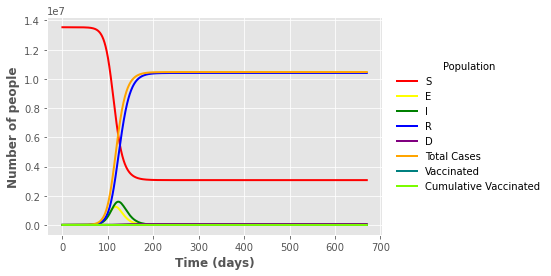

In [14]:
#stochastic
plt.style.use("ggplot")
sline = plt.plot("t","S","",data=sir_out,color="red",linewidth=2)
eline = plt.plot("t","E","",data=sir_out,color="yellow",linewidth=2)
iline = plt.plot("t","I","",data=sir_out,color="green",linewidth=2)
rline = plt.plot("t","R","",data=sir_out,color="blue",linewidth=2)
dline = plt.plot("t","D","",data=sir_out,color="purple",linewidth=2)
tline = plt.plot("t","Total Cases","",data=sir_out,color="orange",linewidth=2)
vline = plt.plot("t","Vaccinated","",data=sir_out,color="teal",linewidth=2)
vcline = plt.plot("t","Cumulative Vaccinated","",data=sir_out,color="lawngreen",linewidth=2)
plt.xlabel("Time (days)",fontweight="bold")
plt.ylabel("Number of people",fontweight="bold")
legend = plt.legend(title="Population",loc=5,bbox_to_anchor=(1.50,0.5))
frame = legend.get_frame()
frame.set_facecolor("white")
frame.set_linewidth(0)

In [143]:
#deterministic
plt.style.use("ggplot")
sline = plt.plot("t","S","",data=sir_out_det,color="red",linewidth=2)
eline = plt.plot("t","E","",data=sir_out_det,color="yellow",linewidth=2)
iline = plt.plot("t","I","",data=sir_out_det,color="green",linewidth=2)
rline = plt.plot("t","R","",data=sir_out_det,color="blue",linewidth=2)
dline = plt.plot("t","D","",data=sir_out_det,color="purple",linewidth=2)
tline = plt.plot("t","Total Cases","",data=sir_out_det,color="orange",linewidth=2)
vline = plt.plot("t","Vaccinated","",data=sir_out_det,color="teal",linewidth=2)
vcline = plt.plot("t","Cumulative Vaccinated","",data=sir_out_det,color="lawngreen",linewidth=2)

plt.xlabel("Time (days)",fontweight="bold")
plt.ylabel("Number of people",fontweight="bold")
legend = plt.legend(title="Population",loc=5,bbox_to_anchor=(1.50,0.5))
frame = legend.get_frame()
frame.set_facecolor("white")
frame.set_linewidth(0)

NameError: name 'sir_out_det' is not defined

In [4]:
df = pd.read_csv (r'C:\Users\Michael\Desktop\Project Notebook\City Data\Combined2.csv')

Data = df[::-1]

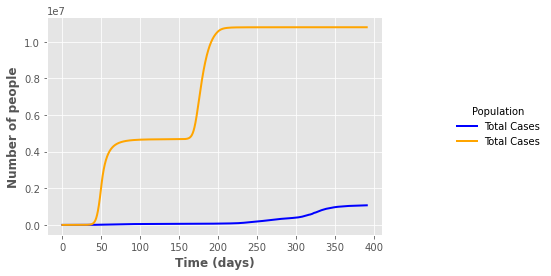

In [19]:
plt.style.use("ggplot")
caseline = plt.plot("Day","Total Cases","",data=Data,color="blue",linewidth=2)
tline = plt.plot("t","Total Cases","",data=sir_out,color="orange",linewidth=2)



plt.xlabel("Time (days)",fontweight="bold")
plt.ylabel("Number of people",fontweight="bold")
legend = plt.legend(title="Population",loc=5,bbox_to_anchor=(1.50,0.5))
frame = legend.get_frame()
frame.set_facecolor("white")
frame.set_linewidth(0)

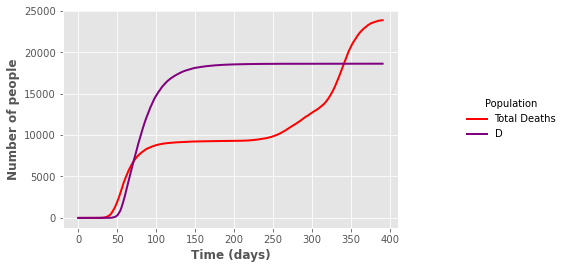

In [25]:
plt.style.use("ggplot")
deadline = plt.plot("Day","Total Deaths","",data=Data,color="red",linewidth=2)
dline = plt.plot("t","D","",data=sir_out,color="purple",linewidth=2)



plt.xlabel("Time (days)",fontweight="bold")
plt.ylabel("Number of people",fontweight="bold")
legend = plt.legend(title="Population",loc=5,bbox_to_anchor=(1.50,0.5))
frame = legend.get_frame()
frame.set_facecolor("white")
frame.set_linewidth(0)

11441.69538283348


NameError: name 'sir_out_det' is not defined

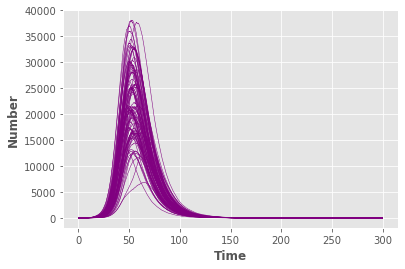

In [12]:
tic = time.time()
for i in range(0,100):
    sir_out = pd.DataFrame(SIRSto(5, 0.1, 300, 301, 70))
    plt.style.use("ggplot")
    line = plt.plot("t","I","",data=sir_out,color="purple",linewidth=0.5)
    plt.xlabel("Time",fontweight="bold")
    plt.ylabel("Number",fontweight="bold")
toc = time.time()
print(toc-tic)

linedet = plt.plot("t","I","",data=sir_out_det,color="black",linewidth=2)

In [19]:
# finds actual effectiveness of vaccine over 100 stochastic trials
#filters out effectivenesses of 100% as these occur when no outbreak has happened mathematically
#potentially skewed by very minor outbreaks meaning less vaccinated people come into contact with infected people
Actual_eff = []
for i in range(0,100):
    sir_out = pd.DataFrame(SIRSto(5, 100000, 0.1, 1, 300, 50, 82))
    v_max = (np.max(sir_out["Cumulative Vaccinated"]))
    v_fin = sir_out["Vaccinated"].iloc[-1]
    Actual_eff.append((v_fin/v_max)*100)
    
    
F_Actual_eff = []
for i in range(0, len(Actual_eff)):
    if Actual_eff[i] != 100.0:
        F_Actual_eff.append(Actual_eff[i])

np.average(F_Actual_eff)

81.87789763191864

In [ ]:
#finds actual effectiveness of vaccine in deterministic model
sir_out_det = pd.DataFrame(SIRDet(5, 100000, 0.1, 1, 300, 50, 70))
v_max = (np.max(sir_out_det["V_c"]))
v_fin = sir_out_det["V"].iloc[-1]
print((v_fin/v_max)*100)

In [ ]:
#Everything beyond this point for simple testing purposes only or deleted stuff previously part of the model

In [8]:
g = np.zeros((3,3,2,2))
T = np.zeros(3)
g[0,0,1,1] = 3
g[1,2,1,1] = 6
g[1,0,1,0] = 2
g[1,0,0,0] = 5
print(g)
print(g[1,])

np.sum(g[:,2,1])
np.sum(g[1,])
T[0] = np.sum(g[0,])
T[1] = np.sum(g[1,:,1,:])
T[2] = np.sum(g[2,])

print(T)

[[[[0. 0.]
   [0. 3.]]

  [[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]]


 [[[5. 0.]
   [2. 0.]]

  [[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 6.]]]


 [[[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]

  [[0. 0.]
   [0. 0.]]]]
[[[5. 0.]
  [2. 0.]]

 [[0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 6.]]]
[3. 8. 0.]


In [42]:
P = [0,0,0,0,0,0,0,0,0,0]
print(P[1])
P[1] = 1
print(P)
S = np.random.multinomial(5,P)
print(S)

0
[0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
[0 5 0 0 0 0 0 0 0 0]


In [ ]:
#copy and paste transition probabilities between bubbles
P = [0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01]
P[b] = 0.91
[0,0,0,0,0,0,0,0,0,0]
P[b] = 1
P = [0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001]
P[b] = 0.991

#c and p bubble populations
N = 100000
demographic_healthy = [N/18, N/18, N/18, N/18, N/18, N/18, N/18, N/18, N/18]
demographic_comorbid = [N/18, N/18, N/18, N/18, N/18, N/18, N/18, N/18, N/18]
infected_healthy = [0,0,0,1,0,0,0,0,0]
infected_comorbid = [0,0,0,0,0,0,0,0,0]

N = 18000
demographic_healthy = [1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000]
demographic_comorbid = [1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000]
infected_healthy = [0,0,0,1,0,0,0,0,0]
infected_comorbid = [0,0,0,0,0,0,0,0,0]
 

In [ ]:
#saved parameters
    if i == 0:
        if j == 0:
           beta = 0.032*3
           gamma = 0.020*3
           mu = 0.00001
        if j == 1:
           beta = 0.032*3
           gamma = 0.019*3
           mu = 0.00005
    # i = 1 : 11-20
    if i == 1:
        if j == 0:
           beta = 0.034*3
           gamma = 0.021*3
           mu = 0.00002
        if j == 1:
           beta = 0.034*3
           gamma = 0.020*3
           mu = 0.00007
    # i = 2 : 21-30
    if i == 2:
        if j == 0:
           beta = 0.035*3
           gamma = 0.019*3
           mu = 0.00003
        if j == 1:
           beta = 0.034*3
           gamma = 0.019*3
           mu = 0.00008
    # i = 3 : 31-40
    if i == 3:
        if j == 0:
           beta = 0.032*3
           gamma = 0.017*3
           mu = 0.0001
        if j == 1:
           beta = 0.030*3
           gamma = 0.016*3
           mu = 0.00025 
    # i = 4 : 41-50
    if i == 4:
        if j == 0:
           beta = 0.03*3
           gamma = 0.016*3
           mu = 0.00015
        if j == 1:
           beta = 0.028*3
           gamma = 0.014*3
           mu = 0.00013    
    # i = 5 : 51-60
    if i == 5:
        if j == 0:
           beta = 0.028*3
           gamma = 0.013*3
           mu = 0.0002
        if j == 1:
           beta = 0.026*3
           gamma = 0.011*3
           mu = 0.0003  
    # i = 6 : 61-70
    if i == 6: 
        if j == 0:
           beta = 0.025*3
           gamma = 0.010*3
           mu = 0.00025
        if j == 1:
           beta = 0.024*3
           gamma = 0.0095*3
           mu = 0.0004   
    # i = 7 : 71-80
    if i == 7: 
        if j == 0:
           beta = 0.023*3
           gamma = 0.0075*3
           mu = 0.0005
        if j == 1:
           beta = 0.020*3
           gamma = 0.006*3
           mu = 0.002    
    # i = 8 : 81+
    if i == 8:
        if j == 0:
           beta = 0.020*3
           gamma = 0.006*3
           mu = 0.001
        if j == 1:
           beta = 0.016*3
           gamma = 0.003*3
           mu = 0.005

In [ ]:
    if i == 0:
        if j == 0:
           beta = 0.32
           gamma = 0.20
           mu = 0.0001
        if j == 1:
           beta = 0.32
           gamma = 0.19
           mu = 0.0005
    # i = 1 : 11-20
    if i == 1:
        if j == 0:
           beta = 0.34
           gamma = 0.21
           mu = 0.0002
        if j == 1:
           beta = 0.34
           gamma = 0.20
           mu = 0.0007
    # i = 2 : 21-30
    if i == 2:
        if j == 0:
           beta = 0.35
           gamma = 0.19
           mu = 0.0003
        if j == 1:
           beta = 0.34
           gamma = 0.19
           mu = 0.0008
    # i = 3 : 31-40
    if i == 3:
        if j == 0:
           beta = 0.32
           gamma = 0.17
           mu = 0.001
        if j == 1:
           beta = 0.30
           gamma = 0.16
           mu = 0.0025 
    # i = 4 : 41-50
    if i == 4:
        if j == 0:
           beta = 0.3
           gamma = 0.16
           mu = 0.0015
        if j == 1:
           beta = 0.28
           gamma = 0.14
           mu = 0.0013    
    # i = 5 : 51-60
    if i == 5:
        if j == 0:
           beta = 0.28
           gamma = 0.13
           mu = 0.002
        if j == 1:
           beta = 0.26
           gamma = 0.11
           mu = 0.003  
    # i = 6 : 61-70
    if i == 6: 
        if j == 0:
           beta = 0.25
           gamma = 0.10
           mu = 0.0025
        if j == 1:
           beta = 0.24
           gamma = 0.095
           mu = 0.004   
    # i = 7 : 71-80
    if i == 7: 
        if j == 0:
           beta = 0.23
           gamma = 0.075
           mu = 0.005
        if j == 1:
           beta = 0.20
           gamma = 0.06
           mu = 0.02    
    # i = 8 : 81+
    if i == 8:
        if j == 0:
           beta = 0.20
           gamma = 0.06
           mu = 0.01
        if j == 1:
           beta = 0.16
           gamma = 0.03
           mu = 0.05

In [ ]:
    if i == 0:
        if j == 0:
           beta = 0.032
           gamma = 0.020
           mu = 0.00001
        if j == 1:
           beta = 0.032
           gamma = 0.019
           mu = 0.00005
    # i = 1 : 11-20
    if i == 1:
        if j == 0:
           beta = 0.034
           gamma = 0.021
           mu = 0.00002
        if j == 1:
           beta = 0.034
           gamma = 0.020
           mu = 0.00007
    # i = 2 : 21-30
    if i == 2:
        if j == 0:
           beta = 0.035
           gamma = 0.019
           mu = 0.00003
        if j == 1:
           beta = 0.034
           gamma = 0.019
           mu = 0.00008
    # i = 3 : 31-40
    if i == 3:
        if j == 0:
           beta = 0.032
           gamma = 0.017
           mu = 0.0001
        if j == 1:
           beta = 0.030
           gamma = 0.016
           mu = 0.00025 
    # i = 4 : 41-50
    if i == 4:
        if j == 0:
           beta = 0.03
           gamma = 0.016
           mu = 0.00015
        if j == 1:
           beta = 0.028
           gamma = 0.014
           mu = 0.00013
    # i = 5 : 51-60
    if i == 5:
        if j == 0:
           beta = 0.028
           gamma = 0.013
           mu = 0.0002
        if j == 1:
           beta = 0.026
           gamma = 0.011
           mu = 0.0003  
    # i = 6 : 61-70
    if i == 6: 
        if j == 0:
           beta = 0.025
           gamma = 0.010
           mu = 0.00025
        if j == 1:
           beta = 0.024
           gamma = 0.0095
           mu = 0.0004   
    # i = 7 : 71-80
    if i == 7: 
        if j == 0:
           beta = 0.023
           gamma = 0.0075
           mu = 0.0005
        if j == 1:
           beta = 0.020
           gamma = 0.006
           mu = 0.002    
    # i = 8 : 81+
    if i == 8:
        if j == 0:
           beta = 0.020
           gamma = 0.006
           mu = 0.001
        if j == 1:
           beta = 0.016
           gamma = 0.003
           mu = 0.005

In [ ]:
if i == 0:
        if j == 0:
           beta = 0.032*8
           gamma = 0.020*8
           mu = 0.00001
        if j == 1:
           beta = 0.032*8
           gamma = 0.019*8
           mu = 0.00005
    # i = 1 : 11-20
    if i == 1:
        if j == 0:
           beta = 0.034*8
           gamma = 0.021*8
           mu = 0.00002
        if j == 1:
           beta = 0.034*8
           gamma = 0.020*8
           mu = 0.00007
    # i = 2 : 21-30
    if i == 2:
        if j == 0:
           beta = 0.035*8
           gamma = 0.019*8
           mu = 0.00003
        if j == 1:
           beta = 0.034*8
           gamma = 0.019*8
           mu = 0.00008
    # i = 3 : 31-40
    if i == 3:
        if j == 0:
           beta = 0.032*8
           gamma = 0.017*8
           mu = 0.0001
        if j == 1:
           beta = 0.030*8
           gamma = 0.016*8
           mu = 0.00025 
    # i = 4 : 41-50
    if i == 4:
        if j == 0:
           beta = 0.03*8
           gamma = 0.016*8
           mu = 0.00015
        if j == 1:
           beta = 0.028*8
           gamma = 0.014*8
           mu = 0.00013    
    # i = 5 : 51-60
    if i == 5:
        if j == 0:
           beta = 0.028*8
           gamma = 0.013*8
           mu = 0.0002
        if j == 1:
           beta = 0.026*8
           gamma = 0.011*8
           mu = 0.0003  
    # i = 6 : 61-70
    if i == 6: 
        if j == 0:
           beta = 0.025*8
           gamma = 0.010*8
           mu = 0.00025
        if j == 1:
           beta = 0.024*8
           gamma = 0.0095*8
           mu = 0.0004   
    # i = 7 : 71-80
    if i == 7: 
        if j == 0:
           beta = 0.023*8
           gamma = 0.0075*8
           mu = 0.0005
        if j == 1:
           beta = 0.020*8
           gamma = 0.006*8
           mu = 0.002    
    # i = 8 : 81+
    if i == 8:
        if j == 0:
           beta = 0.020*8
           gamma = 0.006*8
           mu = 0.001
        if j == 1:
           beta = 0.016*8
           gamma = 0.003*8
           mu = 0.005

In [ ]:
#Deleted Scottish Cities
if b == 3: #Glasgow
        N = 633120
        demographic_healthy = [111093,135008,104561,68399,71537,49944,29066,12031,1579]
        demographic_comorbid = [505,2469,5642,6564,9069,8370,7686,7292,2305]
        infected_healthy = [0,0,0,1,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        
if b == 7: #Edinburgh
        N = 524930
        demographic_healthy = [87085,109302,87174,60264,55584,41742,27115,11439,1706]
        demographic_comorbid = [396,1999,4704,5784,7047,6995,7170,6932,2492]
        infected_healthy = [0,0,0,1,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]

In [30]:

n = np.arange(20,40,0.1)
print(n)

t = 20.9

for i in range(0, len(n)):
    if t == n[i]:
        print('True')
    else:
        print('False')

[20.  20.1 20.2 20.3 20.4 20.5 20.6 20.7 20.8 20.9 21.  21.1 21.2 21.3
 21.4 21.5 21.6 21.7 21.8 21.9 22.  22.1 22.2 22.3 22.4 22.5 22.6 22.7
 22.8 22.9 23.  23.1 23.2 23.3 23.4 23.5 23.6 23.7 23.8 23.9 24.  24.1
 24.2 24.3 24.4 24.5 24.6 24.7 24.8 24.9 25.  25.1 25.2 25.3 25.4 25.5
 25.6 25.7 25.8 25.9 26.  26.1 26.2 26.3 26.4 26.5 26.6 26.7 26.8 26.9
 27.  27.1 27.2 27.3 27.4 27.5 27.6 27.7 27.8 27.9 28.  28.1 28.2 28.3
 28.4 28.5 28.6 28.7 28.8 28.9 29.  29.1 29.2 29.3 29.4 29.5 29.6 29.7
 29.8 29.9 30.  30.1 30.2 30.3 30.4 30.5 30.6 30.7 30.8 30.9 31.  31.1
 31.2 31.3 31.4 31.5 31.6 31.7 31.8 31.9 32.  32.1 32.2 32.3 32.4 32.5
 32.6 32.7 32.8 32.9 33.  33.1 33.2 33.3 33.4 33.5 33.6 33.7 33.8 33.9
 34.  34.1 34.2 34.3 34.4 34.5 34.6 34.7 34.8 34.9 35.  35.1 35.2 35.3
 35.4 35.5 35.6 35.7 35.8 35.9 36.  36.1 36.2 36.3 36.4 36.5 36.6 36.7
 36.8 36.9 37.  37.1 37.2 37.3 37.4 37.5 37.6 37.7 37.8 37.9 38.  38.1
 38.2 38.3 38.4 38.5 38.6 38.7 38.8 38.9 39.  39.1 39.2 39.3 39.4 39.5
 39.6 

In [2]:
for j in range (0,1):
    
    print(j)

0


In [15]:
A = np.random.binomial(5,1/5)
print(A)

3


In [ ]:
#Save with vacc popn, use with vaccinated sims, starts from 8th March 2021
def bubble(b):
    if b == 0: #London
        N = 8961989
        demographic_healthy = [2214203,1335437,1619629,1257646,1062485,704000,466856,244277,57456]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [1051,546,629,500,352,130,60,25,11]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [102201,137329,144190,116884,94008,49849,21716,11793,3224]
        dead = [4,20,70,222,708,1570,3503,5846,3344]
        N_vac = 3056893
        
    if b == 1: #Birmingham
        N = 1141816
        demographic_healthy = [323245,203119,158926,133683,124958,89974,63766,36038,8107]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [209,188,205,138,135,54,24,23,10]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [16197,19959,18263,14851,12107,6756,2950,2134,753]
        dead = [1,3,12,38,120,267,595,993,568]
        N_vac = 389468
         
    if b == 2: #Leeds
        N = 793139
        demographic_healthy = [193543,145621,106891,92811,93281,71159,55649,28719,5465]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [119,171,191,128,101,46,15,16,4]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [9840,13315,9511,8050,7707,3794,1956,1558,641]
        dead = [0,2,6,18,58,128,285,476,272]
        N_vac = 270536
 
    
    if b == 3: #Sheffield
        N = 584853
        demographic_healthy = [136266,113715,74788,67445,70269,52358,42848,22480,4684]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [109,93,92,68,58,39,10,18,6]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [6647,8794,6188,5330,5567,2915,1619,1168,429]
        dead = [0,2,5,16,51,114,254,423,242]
        N_vac = 199491
        
    if b == 4: #Manchester
        N = 552858
        demographic_healthy = [140918,134098,93563,59982,53127,35548,22262,10895,2465]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [101,95,80,75,68,21,13,7,2]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [10261,13003,9044,6507,5341,2807,1282,688,138]
        dead = [0,1,5,14,46,101,226,378,216]
        N_vac = 188577
        
    if b == 5: #Bradford
        N = 539776
        demographic_healthy = [156171,65986,74422,69046,65461,51561,35036,18306,3787]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [161,137,158,130,92,59,25,17,4]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [7588,8244,8610,7301,5913,3330,1511,1028,339]
        dead = [0,1,5,15,47,104,233,388,222]
        N_vac = 184115
         
    
    if b == 6: #Liverpool
        N = 498042
        demographic_healthy = [112270,99315,73312,54758,59255,47390,31830,16758,3154]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [48,59,60,25,29,21,11,5,1]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [6749,10441,8476,6193,6732,4329,2024,1113,190]
        dead = [0,2,5,17,54,119,267,445,254]
        N_vac = 169880
        
    if b == 7: #Bristol
        N = 463377
        demographic_healthy = [107379,102350,75299,51826,47215,35510,26286,13875,3637]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [53,43,42,40,28,11,8,4,2]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [5157,8127,5563,3820,3173,1683,848,486,252]
        dead = [0,1,2,7,21,48,106,177,101]
        N_vac = 158056
         
    
    return N, demographic_healthy, demographic_comorbid, infected_healthy, infected_comorbid, recovered, dead, N_vac

In [ ]:
#No vacc settings, use with no vacc sims, starts from 1st Jan 2021
def bubble(b):
    if b == 0: #London
        N = 8961989
        demographic_healthy = [2214203,1335437,1619629,1257646,1062485,704000,466856,244277,57456]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [12697,17700,19645,16353,13420,7043,2996,1585,486]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [54828,65097,66293,53947,41607,21578,10178,6083,1697]
        dead = [2,12,37,121,393,881,2089,3556,1940]
        N_vac = 0
        
    if b == 1: #Birmingham
        N = 1141816
        demographic_healthy = [323245,203119,158926,133683,124958,89974,63766,36038,8107]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [1023,1329,1336,1092,825,480,206,155,62]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [9631,10535,9132,7616,6095,3323,1580,1200,442]
        dead = [0,2,7,22,72,160,381,648,353]
        N_vac = 0
         
    if b == 2: #Leeds
        N = 793139
        demographic_healthy = [193543,145621,106891,92811,93281,71159,55649,28719,5465]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [341,469,472,376,323,163,77,67,22]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [7473,9669,6063,5375,5167,2551,1412,1159,533]
        dead = [0,1,4,13,41,93,220,375,204]
        N_vac = 0
 
    
    if b == 3: #Sheffield
        N = 584853
        demographic_healthy = [136266,113715,74788,67445,70269,52358,42848,22480,4684]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [172,285,258,231,209,114,71,60,25]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [5361,6371,4184,3762,3925,2055,1164,894,350]
        dead = [0,1,3,11,35,78,185,314,171]
        N_vac = 0
        
    if b == 4: #Manchester
        N = 552858
        demographic_healthy = [140918,134098,93563,59982,53127,35548,22262,10895,2465]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [237,464,408,283,223,118,48,20,4]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [8185,9220,5767,4244,3494,1819,885,510,111]
        dead = [0,1,3,10,32,71,169,287,156]
        N_vac = 0
        
    if b == 5: #Bradford
        N = 539776
        demographic_healthy = [156171,65986,74422,69046,65461,51561,35036,18306,3787]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [191,218,279,210,184,81,54,29,8]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [5810,5870,6122,5305,4231,2446,1144,808,266]
        dead = [0,1,3,11,34,77,181,309,168]
        N_vac = 0
         
    
    if b == 6: #Liverpool
        N = 498042
        demographic_healthy = [112270,99315,73312,54758,59255,47390,31830,16758,3154]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [221,618,547,338,354,233,87,46,11]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [4272,5968,4272,3231,3546,2382,1310,730,130]
        dead = [0,1,3,11,34,77,184,313,171]
        N_vac = 0
        
    if b == 7: #Bristol
        N = 463377
        demographic_healthy = [107379,102350,75299,51826,47215,35510,26286,13875,3637]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [222,453,406,236,220,116,43,29,18]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [3678,5334,3030,2092,1700,932,479,301,158]
        dead = [0,0,1,4,12,26,61,104,57]
        N_vac = 0

In [ ]:
#Change popn structure control settings with current demographic, start date 1st March 2020
def bubble(b):
    if b == 0: #London
        N = 8961989
        demographic_healthy = [2214203,1335437,1619629,1257646,1062485,704000,466856,244277,57456]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 17
        
    if b == 1: #Birmingham
        N = 1141816
        demographic_healthy = [323245,203119,158926,133683,124958,89974,63766,36038,8107]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
         
    if b == 2: #Leeds
        N = 793139
        demographic_healthy = [193543,145621,106891,92811,93281,71159,55649,28719,5465]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 2
 
    
    if b == 3: #Sheffield
        N = 584853
        demographic_healthy = [136266,113715,74788,67445,70269,52358,42848,22480,4684]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
        
    if b == 4: #Manchester
        N = 552858
        demographic_healthy = [140918,134098,93563,59982,53127,35548,22262,10895,2465]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
        
    if b == 5: #Bradford
        N = 539776
        demographic_healthy = [156171,65986,74422,69046,65461,51561,35036,18306,3787]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
         
    
    if b == 6: #Liverpool
        N = 498042
        demographic_healthy = [112270,99315,73312,54758,59255,47390,31830,16758,3154]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
        
    if b == 7: #Bristol
        N = 463377
        demographic_healthy = [107379,102350,75299,51826,47215,35510,26286,13875,3637]
        demographic_comorbid = [0,0,0,0,0,0,0,0,0]
        infected_healthy = [0,0,0,0,0,0,0,0,0]
        infected_comorbid = [0,0,0,0,0,0,0,0,0]
        recovered = [0,0,0,0,0,0,0,0,0]
        dead = [0,0,0,0,0,0,0,0,0]
        N_vac = 0
        N_inf = 1
         
    
    return N, demographic_healthy, demographic_comorbid, infected_healthy, infected_comorbid, recovered, dead, N_vac, N_inf